In [1]:
import cv2
import os
import numpy as np
import supervision as sv
import matplotlib.pyplot as plt

# annotate image with detections
from supervision.annotators.utils import (
                                    ColorLookup,
                                    Trace,
                                    resolve_color,
                                    resolve_text_background_xyxy,
                                )


import torch
import torchvision

from groundingdino.util.inference import Model
from segment_anything import sam_model_registry, SamPredictor

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# GroundingDINO config and checkpoint
GROUNDING_DINO_CONFIG_PATH = "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py"
GROUNDING_DINO_CHECKPOINT_PATH = "./groundingdino_swint_ogc.pth"

# Segment-Anything checkpoint
SAM_ENCODER_VERSION = "vit_h"
SAM_CHECKPOINT_PATH = "./sam_vit_h_4b8939.pth"

In [2]:
# Building GroundingDINO inference model
grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

# Building SAM Model and SAM Predictor
sam = sam_model_registry[SAM_ENCODER_VERSION](checkpoint=SAM_CHECKPOINT_PATH)
sam.to(device=DEVICE)
sam_predictor = SamPredictor(sam)

final text_encoder_type: bert-base-uncased


# Wall Ver 1 Final

In [3]:
def filter_small_masks(masks, boxes, image_shape, min_area_ratio=0.1):
    """
    Remove masks that cover less than min_area_ratio (e.g., 10%) of the image area.
    
    masks: list of binary np.arrays
    boxes: np.array (N, 4)
    image_shape: tuple (H, W)
    min_area_ratio: float, e.g., 0.1 for 10%
    """
    H, W = image_shape
    image_area = H * W
    keep = []

    for i, mask in enumerate(masks):
        mask_area = np.sum(mask.astype(bool))
        if mask_area / image_area >= min_area_ratio:
            keep.append(i)

    filtered_masks = [masks[i] for i in keep]
    filtered_boxes = boxes[keep]

    return filtered_masks, filtered_boxes

def filter_noisy_masks(masks, boxes, max_components=30, min_component_area=5):
    """
    Removes masks with too many isolated components (small blobs).

    masks: list of binary masks
    boxes: np.array (N, 4)
    max_components: maximum allowed number of connected components 
    min_component_area: ignore very tiny components (likely noise)
    """
    clean_masks = []
    clean_boxes = []

    for mask, box in zip(masks, boxes):
        # Convert to uint8
        mask_uint8 = (mask.astype(np.uint8) * 255)

        # Get connected components
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask_uint8, connectivity=8)
        
        # Count components above area threshold
        valid_components = sum(stat[cv2.CC_STAT_AREA] > min_component_area for stat in stats[1:])  # skip background

        print("valid_components", valid_components)

        if valid_components <= max_components:
            # pass
            clean_masks.append(mask)
            clean_boxes.append(box)

    return clean_masks, np.array(clean_boxes)


def remove_masks_that_contain_others(masks, boxes, threshold=0.9):
    """
    masks: List of binary numpy arrays (H, W)
    boxes: np.array of shape (N, 4), bbox coordinates
    threshold: overlap ratio threshold to consider one mask inside another
    """
    num_masks = len(masks)
    keep = np.ones(num_masks, dtype=bool)

    for i in range(num_masks):
        for j in range(num_masks):
            if i == j or not keep[i] or not keep[j]:
                continue

            mask_i = masks[i].astype(bool)
            mask_j = masks[j].astype(bool)

            # Area of each mask
            area_i = np.sum(mask_i)
            area_j = np.sum(mask_j)

            # Overlap area
            intersection = np.logical_and(mask_i, mask_j).sum()

            # Check if j is mostly inside i and i is larger
            if intersection / area_j > threshold and area_i > area_j:
                keep[i] = False  # Remove the larger container mask

    # Filter masks and boxes
    filtered_masks = [m for k, m in zip(keep, masks) if k]
    filtered_boxes = boxes[keep]

    return filtered_masks, filtered_boxes


def sample_random_points_from_mask(mask, num_points=1, seed=None):
    """
    Randomly sample points from a binary mask.
    
    Parameters:
        mask (np.ndarray): Binary mask of shape (H, W)
        num_points (int): Number of points to sample
        seed (int, optional): Seed for reproducibility

    Returns:
        List of (x, y) tuples for sampled points
    """
    if seed is not None:
        np.random.seed(seed)

    # Get all coordinates where mask is True (i.e., 1 or non-zero)
    ys, xs = np.where(mask > 0)

    if len(xs) == 0:
        return []  # No valid points in the mask

    indices = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False)
    sampled_points = [(xs[i], ys[i]) for i in indices]

    return sampled_points


E:\3d-recon\MoGe\ASARoomImage\b01.jpg


labels ['mirror. 0.47', 'window. 0.57', 'door. 0.44', 'window. 0.25', 'mirror. 0.30', 'window. 0.32']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 6
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.57', 'mirror. 0.47', 'door. 0.44', 'window. 0.32']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


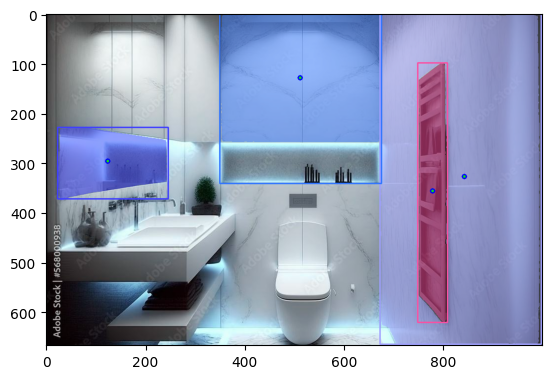

E:\3d-recon\MoGe\ASARoomImage\b02.jpg
labels ['door. 0.52', 'mirror. 0.33', 'window. 0.69', 'mirror. 0.30']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 2
valid_components 24
valid_components 1
valid_components 6
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.69', 'door. 0.52', 'mirror. 0.33']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


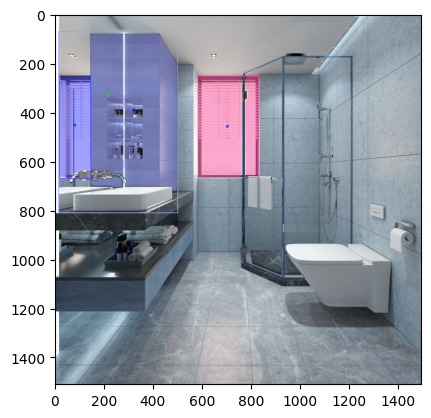

E:\3d-recon\MoGe\ASARoomImage\b04.jpg
labels ['door. 0.71', 'window. 0.43', 'window. 0.37', 'mirror. 0.31', 'mirror. 0.36', 'mirror. 0.30']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.71', 'window. 0.43', 'window. 0.37', 'mirror. 0.36']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


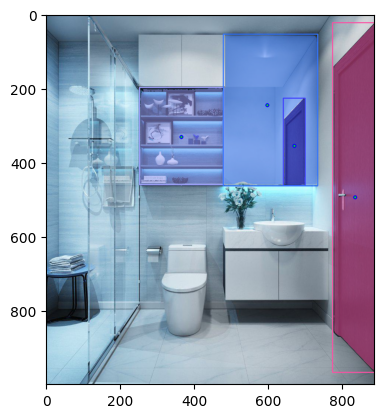

E:\3d-recon\MoGe\ASARoomImage\b06.jpg
labels ['mirror. 0.71', 'window. 0.29', 'door. 0.53']
Before NMS: 3 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 36
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.71']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


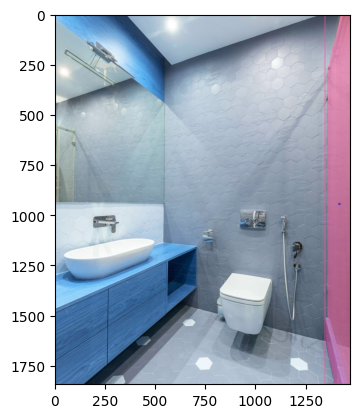

E:\3d-recon\MoGe\ASARoomImage\b07.jpg
labels ['mirror. 0.73', 'door. 0.37', 'door. 0.35', 'door. 0.25']
Before NMS: 4 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 3
valid_components 11
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.73', 'door. 0.37', 'door. 0.35']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


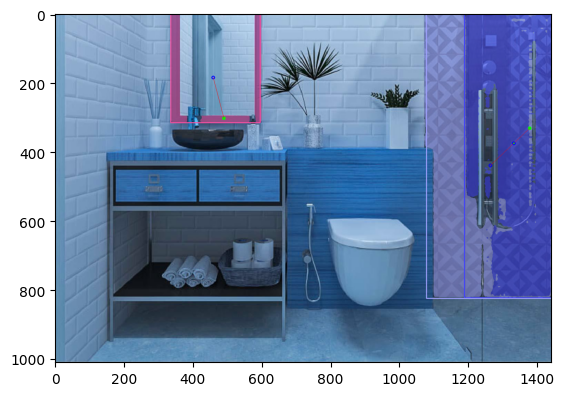

E:\3d-recon\MoGe\ASARoomImage\b09.jpg
labels ['door. 0.30', 'window. 0.40', 'window. 0.33', 'door. 0.26']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 4
valid_components 1
valid_components 21
valid_components 7
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.40', 'window. 0.33']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


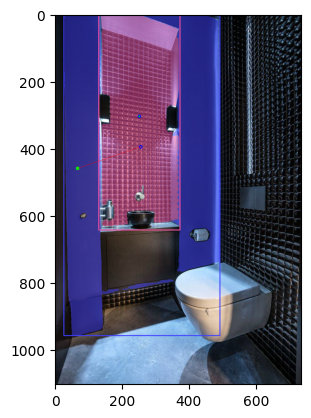

E:\3d-recon\MoGe\ASARoomImage\b10.jpg
labels ['mirror. 0.69', 'door. 0.58', 'mirror. 0.29']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.69', 'door. 0.58', 'mirror. 0.29']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


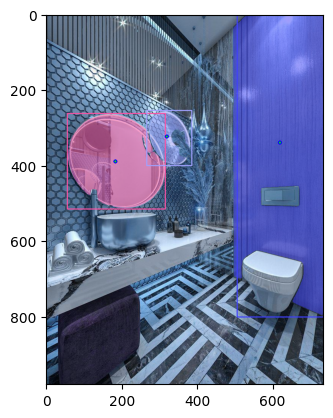

E:\3d-recon\MoGe\ASARoomImage\b11.jpg
labels ['mirror. 0.68', 'window. 0.31', 'door. 0.39', 'window. 0.34', 'door. 0.38']
Before NMS: 5 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 3
valid_components 13
valid_components 2
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.68', 'door. 0.39']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


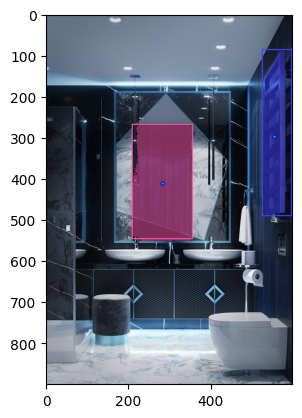

E:\3d-recon\MoGe\ASARoomImage\b12.jpg
labels ['mirror. 0.50', 'window. 0.49', 'mirror. 0.39', 'door. 0.42', 'mirror. 0.36', 'mirror. 0.30', 'mirror. 0.31', 'door. 0.25', 'door. 0.35', 'door. 0.26', 'mirror. 0.30']
Before NMS: 11 boxes
After NMS: 10 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 5
valid_components 1
valid_components 1
valid_components 7
valid_components 2
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.50', 'window. 0.49', 'door. 0.42', 'mirror. 0.39', 'mirror. 0.36', 'door. 0.35']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


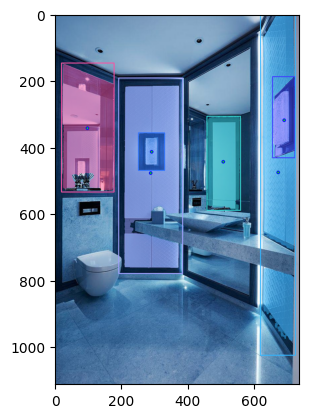

E:\3d-recon\MoGe\ASARoomImage\b13.jpg
labels ['mirror. 0.52', 'window. 0.64', 'mirror. 0.33', 'door. 0.36']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 8
valid_components 1
valid_components 6
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.64', 'mirror. 0.52', 'door. 0.36', 'mirror. 0.33']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


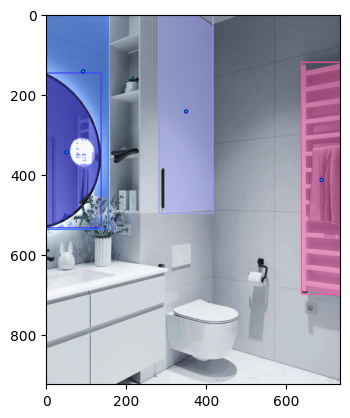

E:\3d-recon\MoGe\ASARoomImage\b14.jpg
labels ['window. 0.80', 'door. 0.54']
Before NMS: 2 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.80', 'door. 0.54']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


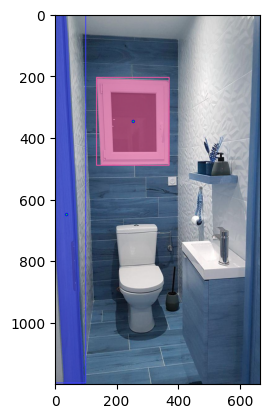

E:\3d-recon\MoGe\ASARoomImage\b15.jpg
labels ['window. 0.46', 'mirror. 0.41', 'door. 0.39', 'window. 0.29', 'door. 0.30', 'door. 0.26', 'mirror. 0.28']
Before NMS: 7 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 3
valid_components 1
valid_components 7
valid_components 4
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.46', 'mirror. 0.41', 'door. 0.39', 'door. 0.30']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


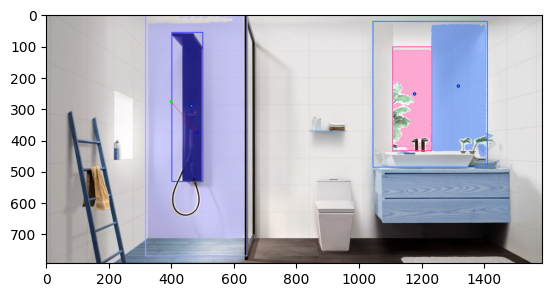

E:\3d-recon\MoGe\ASARoomImage\b18.jpg
labels ['mirror. 0.55', 'door. 0.63', 'window. 0.48', 'window. 0.30', 'mirror. 0.25']
Before NMS: 5 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 2
valid_components 17
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.63', 'mirror. 0.55', 'window. 0.48']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


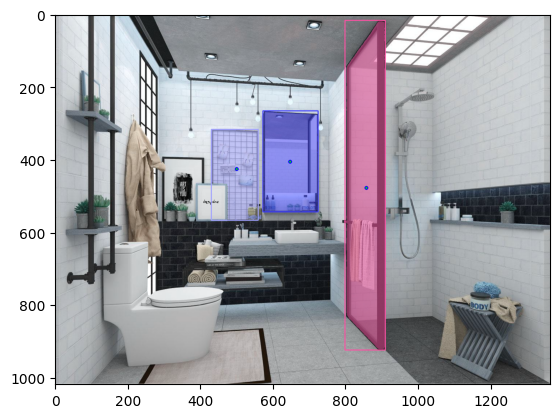

E:\3d-recon\MoGe\ASARoomImage\b19.jpg
labels ['window. 0.54', 'mirror. 0.42', 'door. 0.43', 'mirror. 0.37']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 7
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.54', 'door. 0.43', 'mirror. 0.42', 'mirror. 0.37']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


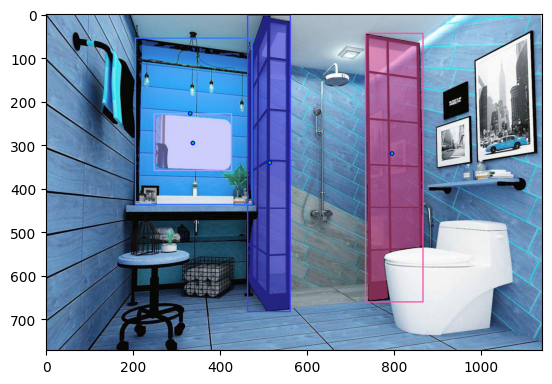

E:\3d-recon\MoGe\ASARoomImage\b20.jpg
labels ['mirror. 0.44', 'mirror. 0.44', 'door. 0.59']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 2
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.59', 'mirror. 0.44', 'mirror. 0.44']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


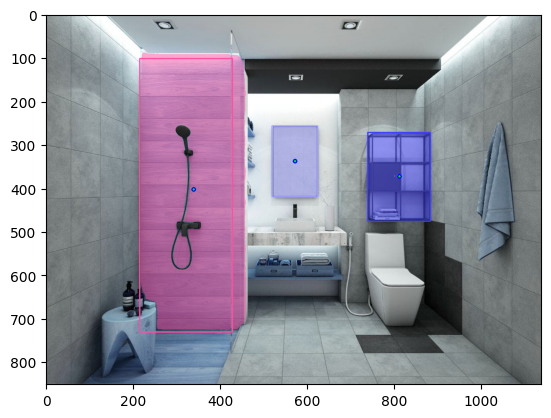

E:\3d-recon\MoGe\ASARoomImage\b21.jpg
labels ['mirror. 0.40', 'window. 0.54', 'mirror. 0.41', 'door. 0.43', 'door. 0.25']
Before NMS: 5 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 4
valid_components 1
valid_components 2
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.54', 'door. 0.43', 'mirror. 0.41']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


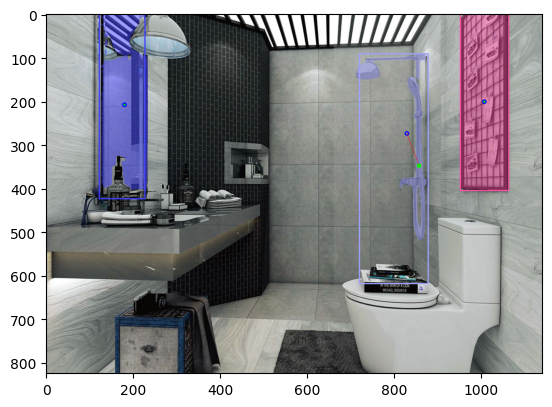

E:\3d-recon\MoGe\ASARoomImage\b22.jpg
labels ['mirror. 0.66', 'door. 0.37', 'door. 0.26', 'door. 0.25']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 3
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.66', 'door. 0.37', 'door. 0.26']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


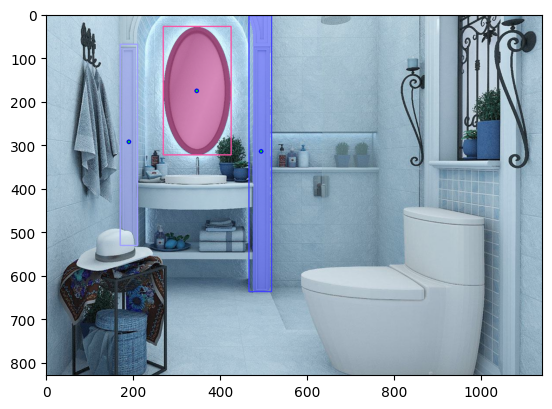

E:\3d-recon\MoGe\ASARoomImage\b23.jpg
labels ['mirror. 0.56', 'window. 0.38', 'door. 0.32', 'door. 0.29', 'window. 0.29']
Before NMS: 5 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 11
valid_components 1
valid_components 1
valid_components 2
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.56', 'window. 0.38', 'door. 0.32']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


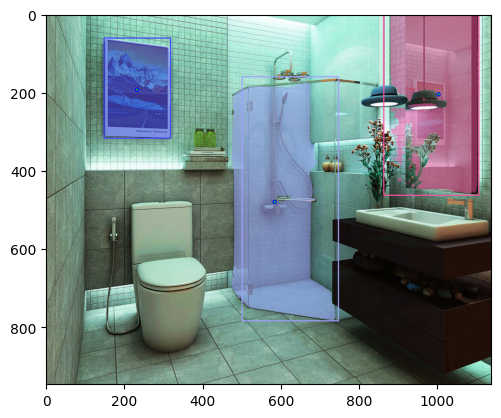

E:\3d-recon\MoGe\ASARoomImage\b24.jpg
labels ['mirror. 0.53', 'window. 0.51', 'window. 0.26', 'door. 0.31', 'mirror. 0.30', 'door. 0.26', 'door. 0.34']
Before NMS: 7 boxes
After NMS: 7 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 2
valid_components 2
valid_components 11
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.53', 'window. 0.51', 'door. 0.34', 'door. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


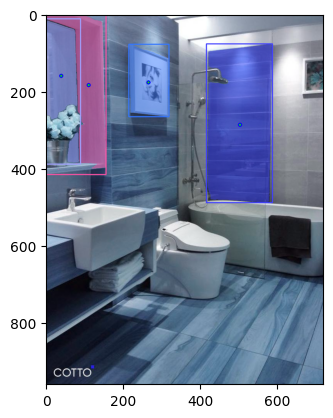

E:\3d-recon\MoGe\ASARoomImage\Bedroom.JPG
labels ['window. 0.50', 'door. 0.26', 'door. 0.30']
Before NMS: 3 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 2
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.50', 'door. 0.30']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


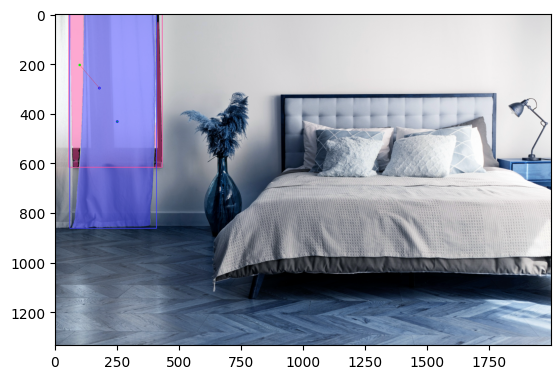

E:\3d-recon\MoGe\ASARoomImage\Bedroom2.JPG
labels ['window. 0.72']
Before NMS: 1 boxes
After NMS: 1 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.72']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


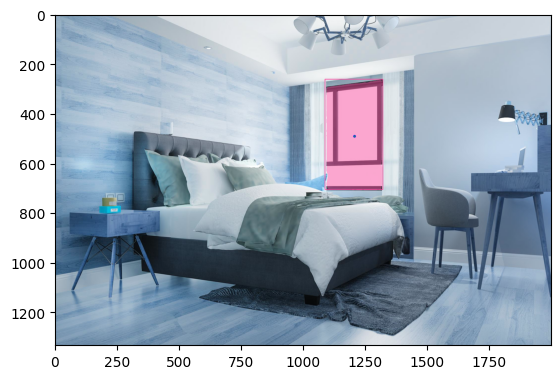

E:\3d-recon\MoGe\ASARoomImage\Bedroom3.JPG
labels ['window. 0.53', 'mirror. 0.53', 'mirror. 0.32', 'window. 0.27']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.53', 'window. 0.53', 'mirror. 0.32']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


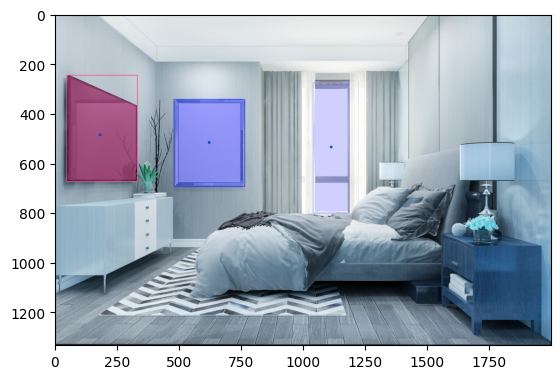

E:\3d-recon\MoGe\ASARoomImage\Bedroom4.JPG
labels ['door. 0.69', 'window. 0.56']
Before NMS: 2 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.69', 'window. 0.56']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


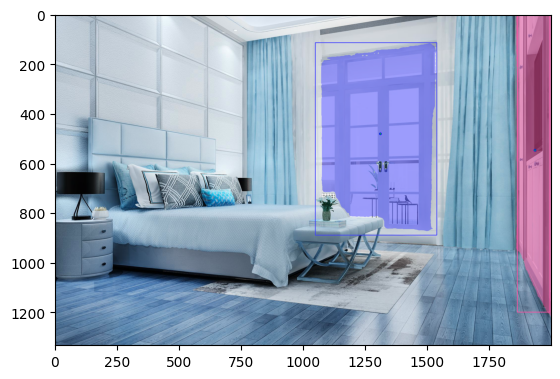

E:\3d-recon\MoGe\ASARoomImage\d01.jpg
labels ['door. 0.75', 'mirror. 0.62', 'window. 0.37', 'window. 0.35']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 2
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.75', 'mirror. 0.62', 'window. 0.37']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


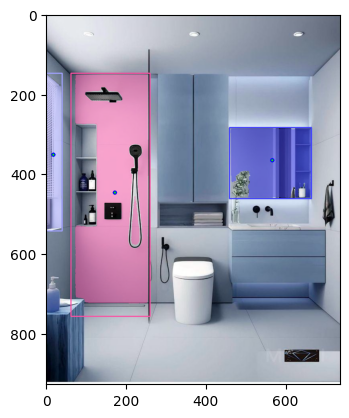

E:\3d-recon\MoGe\ASARoomImage\d02.jpg
labels ['window. 0.74', 'mirror. 0.51', 'mirror. 0.50']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.74', 'mirror. 0.51', 'mirror. 0.50']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


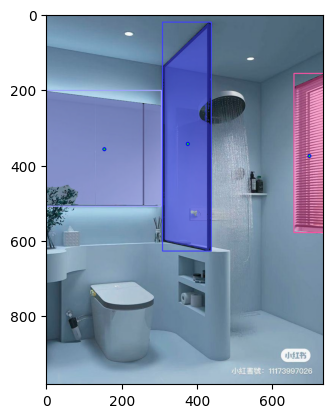

E:\3d-recon\MoGe\ASARoomImage\d03.jpg
labels ['window. 0.72', 'mirror. 0.65', 'door. 0.57', 'door. 0.47']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.72', 'mirror. 0.65']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


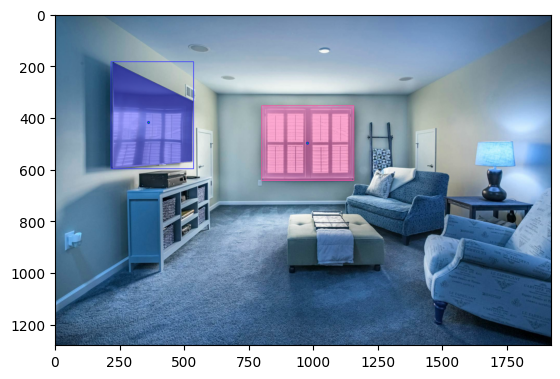

E:\3d-recon\MoGe\ASARoomImage\d04.jpg
labels ['window. 0.46', 'door. 0.53', 'window. 0.35']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 6
valid_components 3
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.53', 'window. 0.46']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


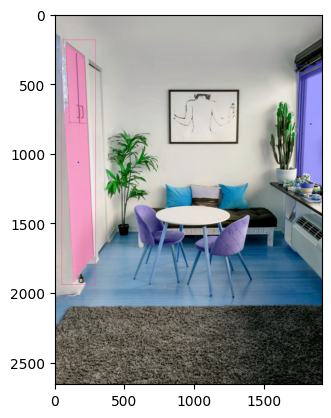

E:\3d-recon\MoGe\ASARoomImage\d05.jpg
labels ['window. 0.40', 'window. 0.38', 'window. 0.38', 'window. 0.36', 'door. 0.30', 'window. 0.32', 'door. 0.31', 'mirror. 0.36', 'window. 0.28', 'window. 0.46', 'window. 0.26']
Before NMS: 11 boxes
After NMS: 11 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 4
valid_components 1
valid_components 5
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.46', 'window. 0.40', 'window. 0.38', 'window. 0.38']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


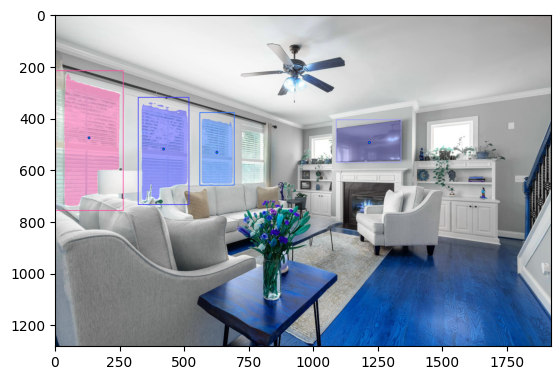

E:\3d-recon\MoGe\ASARoomImage\Image.jpg
labels ['mirror. 0.42', 'mirror. 0.48', 'door. 0.38', 'window. 0.38', 'door. 0.31', 'mirror. 0.27', 'window. 0.25', 'window. 0.26']
Before NMS: 8 boxes
After NMS: 8 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 7
valid_components 1
valid_components 1
valid_components 1
valid_components 30
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.48', 'mirror. 0.42', 'window. 0.38', 'door. 0.38', 'door. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


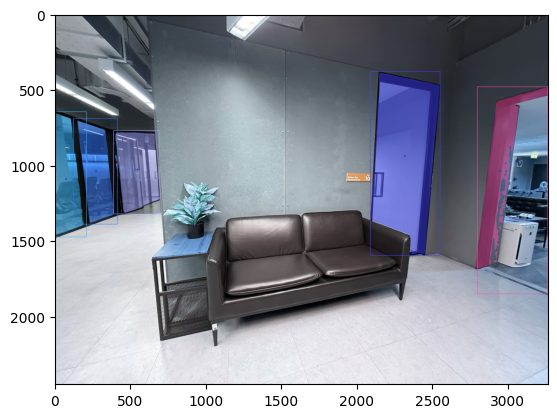

E:\3d-recon\MoGe\ASARoomImage\IMG_0041.JPG
labels ['window. 0.45', 'door. 0.41', 'window. 0.30', 'window. 0.26', 'window. 0.31']
Before NMS: 5 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 6
valid_components 4
valid_components 3
valid_components 9
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.45', 'door. 0.41']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


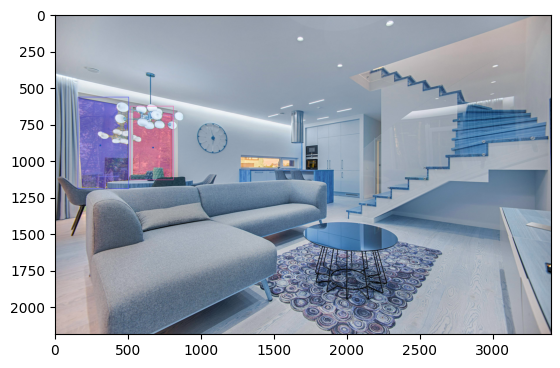

E:\3d-recon\MoGe\ASARoomImage\IMG_0042.PNG
labels ['door. 0.49', 'mirror. 0.44', 'window. 0.25', 'door. 0.25']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.49', 'mirror. 0.44']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


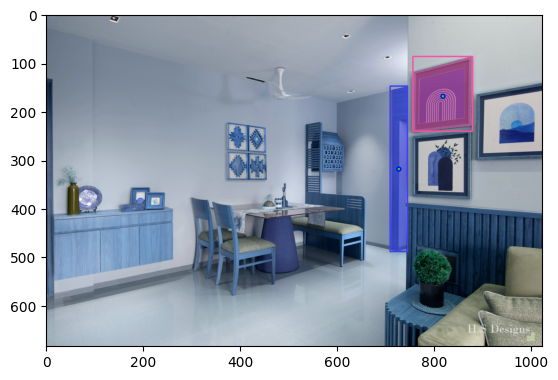

E:\3d-recon\MoGe\ASARoomImage\IMG_0043.JPG
labels ['mirror. 0.72', 'door. 0.43', 'window. 0.32']
Before NMS: 3 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.72', 'door. 0.43']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


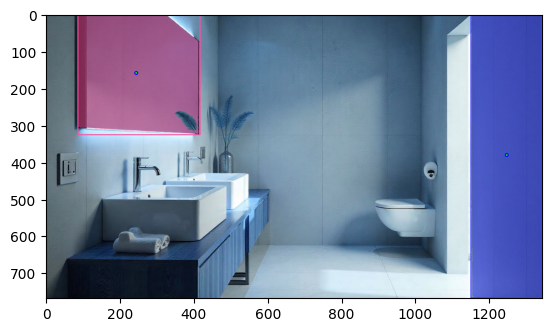

E:\3d-recon\MoGe\ASARoomImage\IMG_0044.JPG
labels ['window. 0.62', 'mirror. 0.35', 'door. 0.46', 'door. 0.29', 'mirror. 0.29', 'mirror. 0.27', 'door. 0.25', 'mirror. 0.35']
Before NMS: 8 boxes
After NMS: 7 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 5
valid_components 1
valid_components 2
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.62', 'door. 0.46', 'mirror. 0.35', 'mirror. 0.35']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


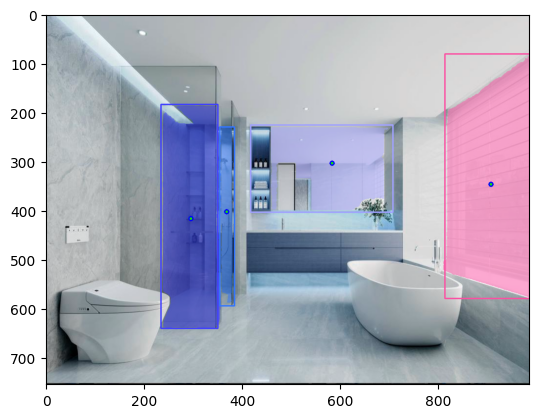

E:\3d-recon\MoGe\ASARoomImage\IMG_0045.JPG
labels ['window. 0.33', 'window. 0.34', 'mirror. 0.28', 'door. 0.27', 'door. 0.27']
Before NMS: 5 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.34', 'window. 0.33', 'mirror. 0.28']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


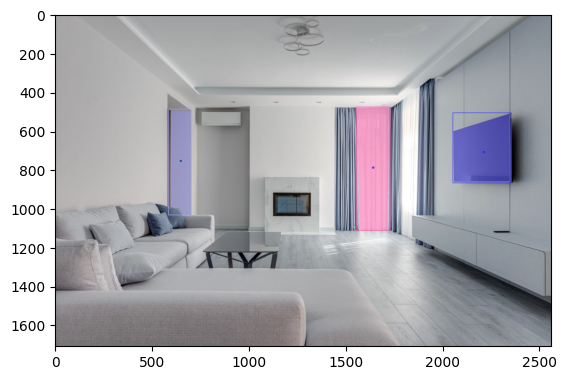

E:\3d-recon\MoGe\ASARoomImage\IMG_0046.JPG
labels ['window. 0.68', 'door. 0.27']
Before NMS: 2 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.68', 'door. 0.27']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


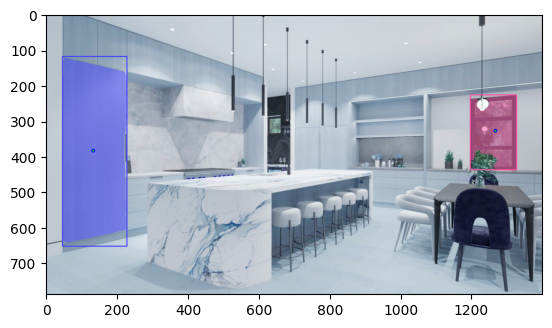

E:\3d-recon\MoGe\ASARoomImage\IMG_0047.JPG
labels ['mirror. 0.61', 'door. 0.40', 'door. 0.27', 'window. 0.36', 'window. 0.34']
Before NMS: 5 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 3
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.61', 'door. 0.40', 'door. 0.27']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


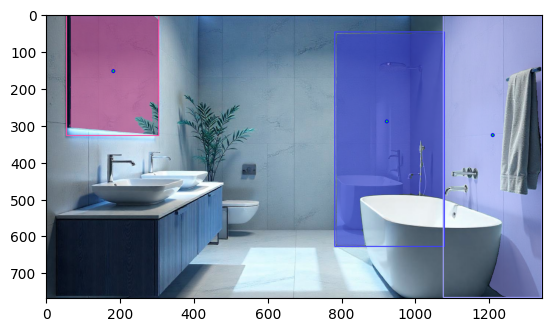

E:\3d-recon\MoGe\ASARoomImage\IMG_0105.JPG
labels ['window. 0.44', 'door. 0.44']
Before NMS: 2 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.44']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


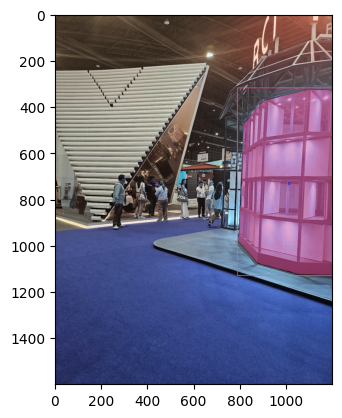

E:\3d-recon\MoGe\ASARoomImage\IMG_0122.PNG
labels ['window. 0.60', 'mirror. 0.31', 'mirror. 0.40', 'door. 0.45', 'door. 0.26', 'mirror. 0.30', 'door. 0.26']
Before NMS: 7 boxes
After NMS: 7 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 12
valid_components 1
valid_components 1
valid_components 8
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.60', 'door. 0.45', 'mirror. 0.40', 'mirror. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


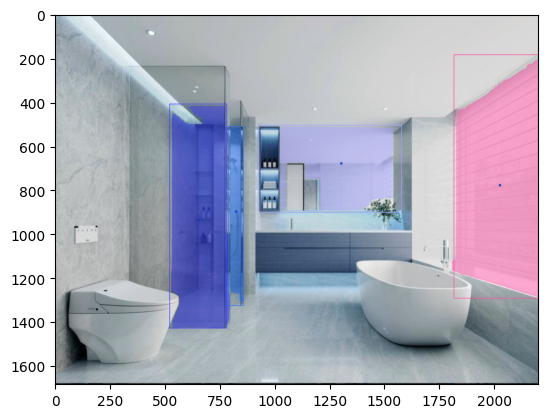

E:\3d-recon\MoGe\ASARoomImage\Kitchen (2).jpeg
labels ['window. 0.72', 'door. 0.37', 'door. 0.31', 'door. 0.37', 'door. 0.27']
Before NMS: 5 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 2
valid_components 1
valid_components 4
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.72', 'door. 0.37', 'door. 0.37', 'door. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


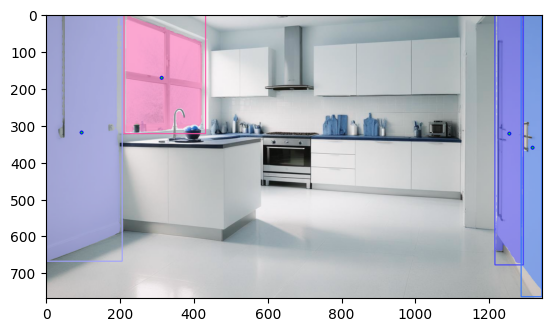

E:\3d-recon\MoGe\ASARoomImage\Kitchen (3).jpeg
labels ['window. 0.58', 'door. 0.64', 'window. 0.43', 'mirror. 0.25']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.64', 'window. 0.58', 'window. 0.43']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


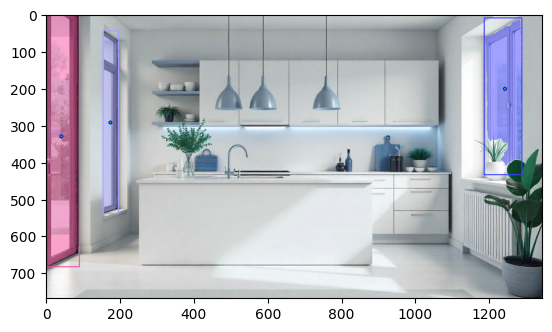

E:\3d-recon\MoGe\ASARoomImage\Kitchen (4).jpeg
labels ['door. 0.34', 'window. 0.44', 'window. 0.31', 'window. 0.29']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.44', 'door. 0.34', 'window. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


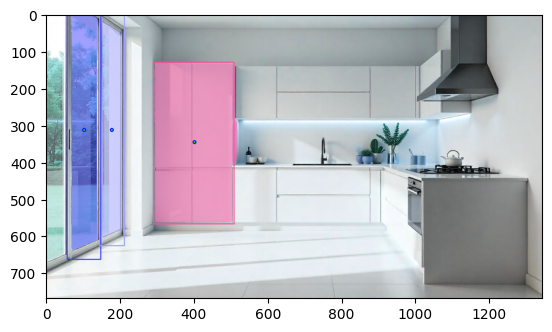

E:\3d-recon\MoGe\ASARoomImage\Kitchen (5).jpeg
labels ['window. 0.57', 'window. 0.30', 'window. 0.29']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 2
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.57', 'window. 0.30']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


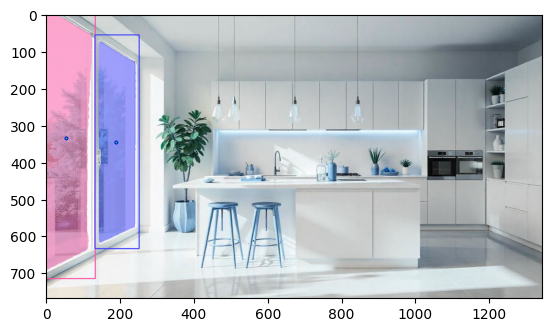

E:\3d-recon\MoGe\ASARoomImage\Kitchen.jpeg
labels ['window. 0.65', 'window. 0.44', 'door. 0.31', 'window. 0.28']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.65', 'window. 0.44', 'door. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


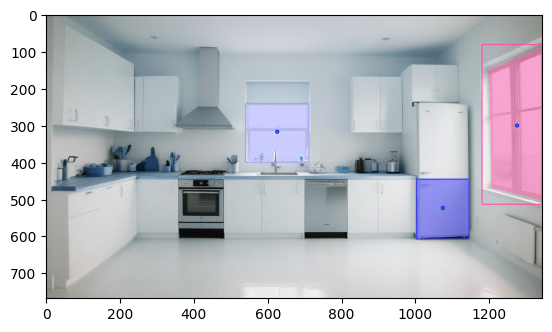

E:\3d-recon\MoGe\ASARoomImage\Kitchen.JPG
labels ['door. 0.76']
Before NMS: 1 boxes
After NMS: 1 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.76']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


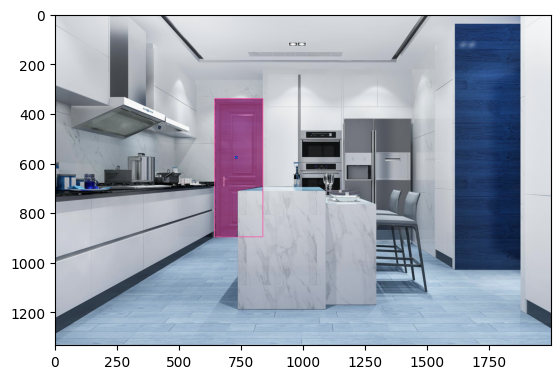

E:\3d-recon\MoGe\ASARoomImage\Kitchen2.JPG
labels ['window. 0.68', 'door. 0.37', 'door. 0.35', 'door. 0.27', 'door. 0.30']
Before NMS: 5 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.68', 'door. 0.37', 'door. 0.35', 'door. 0.30']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


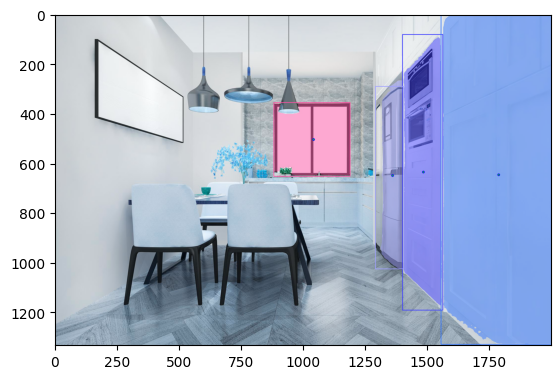

E:\3d-recon\MoGe\ASARoomImage\Kitchen3.JPG
labels ['window. 0.51', 'door. 0.59', 'window. 0.26']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.59', 'window. 0.51']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


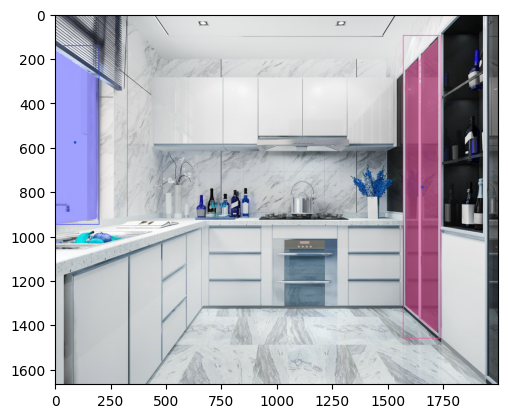

E:\3d-recon\MoGe\ASARoomImage\Kitchen4.JPG
labels ['window. 0.69', 'door. 0.28', 'door. 0.25']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.69', 'door. 0.28', 'door. 0.25']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


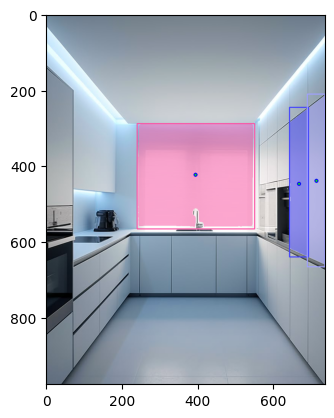

E:\3d-recon\MoGe\ASARoomImage\Living (2).jpeg
labels ['window. 0.40', 'window. 0.32', 'window. 0.31', 'window. 0.46']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.46', 'window. 0.40', 'window. 0.32']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


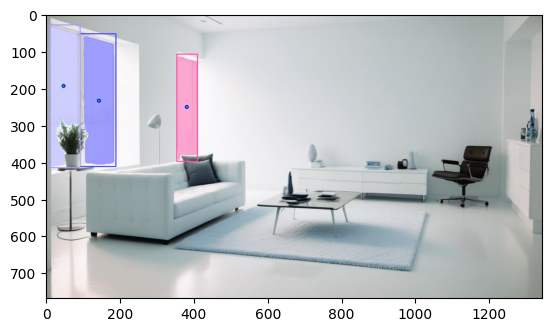

E:\3d-recon\MoGe\ASARoomImage\Living.jpeg
labels ['window. 0.67', 'window. 0.43', 'window. 0.26', 'mirror. 0.30', 'door. 0.26', 'door. 0.26', 'door. 0.25', 'door. 0.30']
Before NMS: 8 boxes
After NMS: 7 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.67', 'window. 0.43', 'mirror. 0.30', 'door. 0.30']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


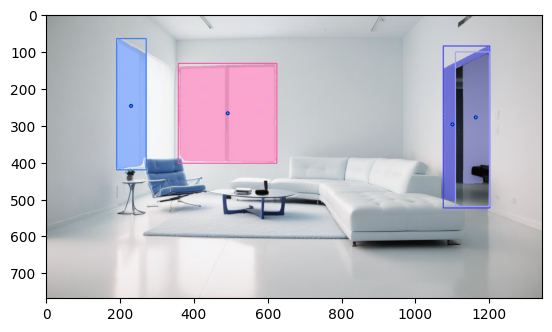

E:\3d-recon\MoGe\ASARoomImage\Living.JPG
labels ['mirror. 0.50', 'mirror. 0.42', 'window. 0.51', 'mirror. 0.39', 'window. 0.28', 'mirror. 0.29']
Before NMS: 6 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 2
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.51', 'mirror. 0.50', 'mirror. 0.42', 'mirror. 0.39']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


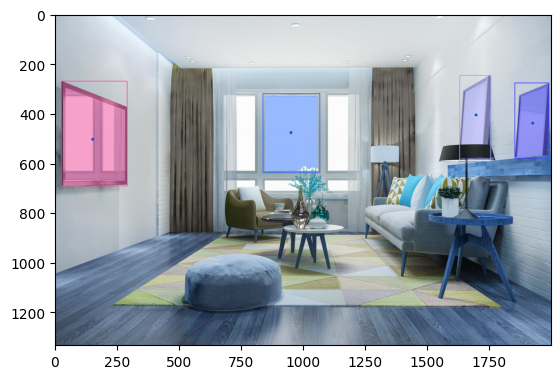

E:\3d-recon\MoGe\ASARoomImage\Living2.JPG
labels ['window. 0.39', 'mirror. 0.50', 'door. 0.25', 'window. 0.40']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 2
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.50', 'window. 0.40']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


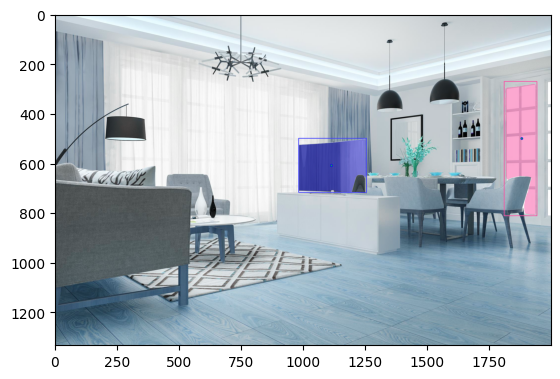

E:\3d-recon\MoGe\ASARoomImage\Living3.JPG
labels ['window. 0.70', 'door. 0.57', 'mirror. 0.31']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 2
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.70', 'door. 0.57', 'mirror. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


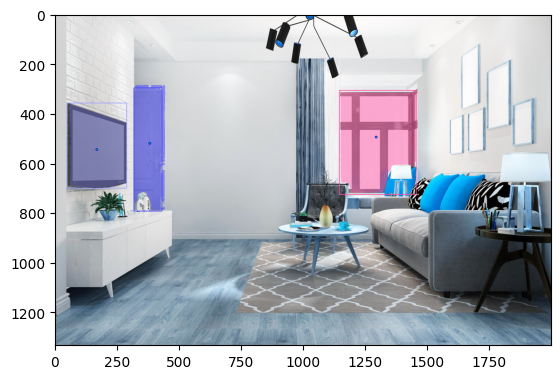

E:\3d-recon\MoGe\ASARoomImage\r02.jpg
labels ['window. 0.32', 'window. 0.32', 'window. 0.27', 'window. 0.35']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 2
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.35', 'window. 0.32']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


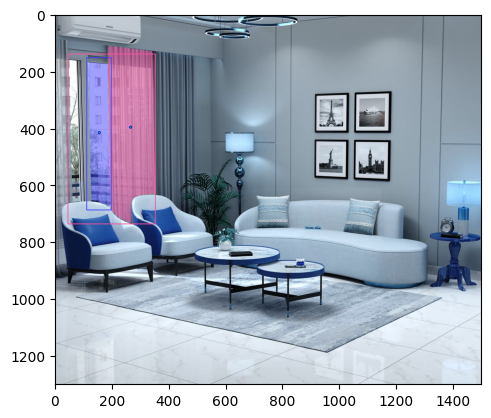

E:\3d-recon\MoGe\ASARoomImage\r13.jpg
labels ['mirror. 0.71', 'window. 0.36', 'door. 0.51', 'window. 0.43']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.71', 'door. 0.51', 'window. 0.43']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


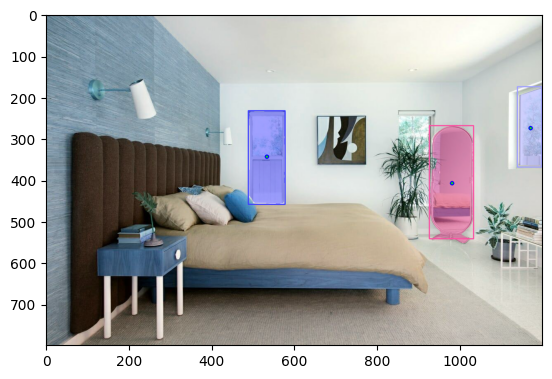

E:\3d-recon\MoGe\ASARoomImage\r14.jpg
labels ['mirror. 0.59', 'window. 0.32', 'window. 0.37', 'window. 0.33', 'window. 0.29', 'door. 0.26']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 2
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.59', 'window. 0.37', 'window. 0.33', 'window. 0.32', 'window. 0.29']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


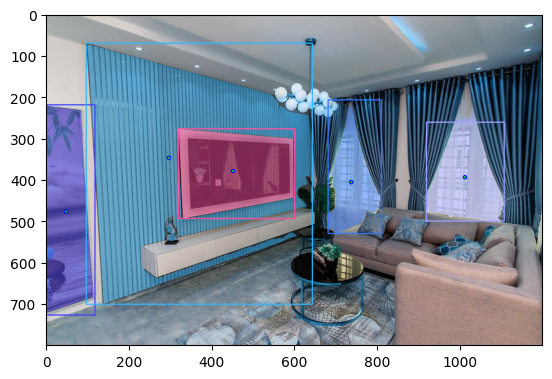

E:\3d-recon\MoGe\ASARoomImage\r15.jpg
labels ['window. 0.47', 'door. 0.64', 'window. 0.25']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 2
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.64', 'window. 0.47', 'window. 0.25']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


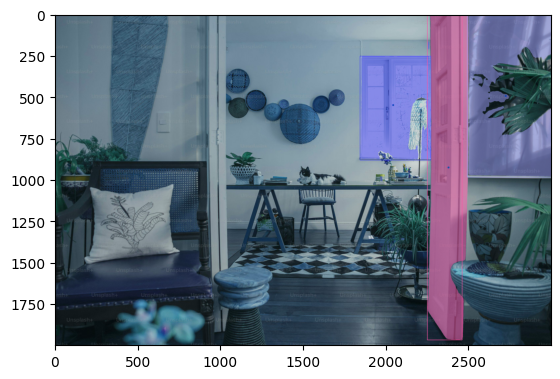

E:\3d-recon\MoGe\ASARoomImage\r16.jpg
labels ['window. 0.49', 'window. 0.46', 'window. 0.44', 'window. 0.36', 'window. 0.27', 'mirror. 0.39', 'window. 0.30']
Before NMS: 7 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 3
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.49', 'window. 0.46', 'window. 0.44', 'mirror. 0.39', 'window. 0.36']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


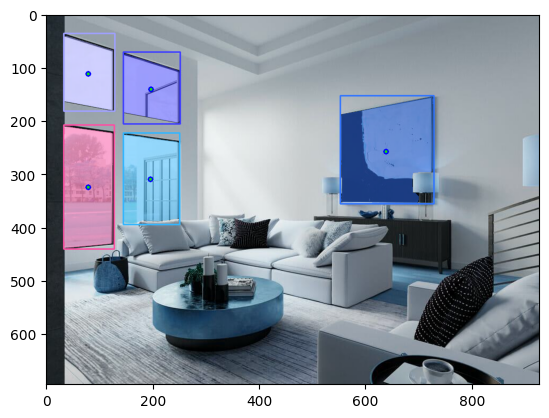

E:\3d-recon\MoGe\ASARoomImage\r17.jpg
labels ['mirror. 0.36', 'window. 0.30', 'door. 0.30', 'mirror. 0.36']
Before NMS: 4 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 2
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.36', 'door. 0.30']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


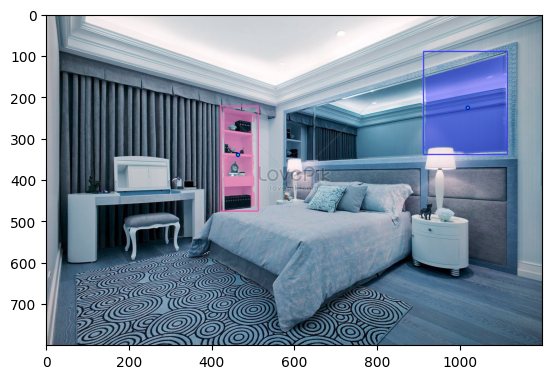

E:\3d-recon\MoGe\ASARoomImage\r21.jpg
labels ['window. 0.64', 'window. 0.57', 'window. 0.59', 'window. 0.54', 'window. 0.51', 'window. 0.34']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 3
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.64', 'window. 0.59', 'window. 0.57', 'window. 0.54']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


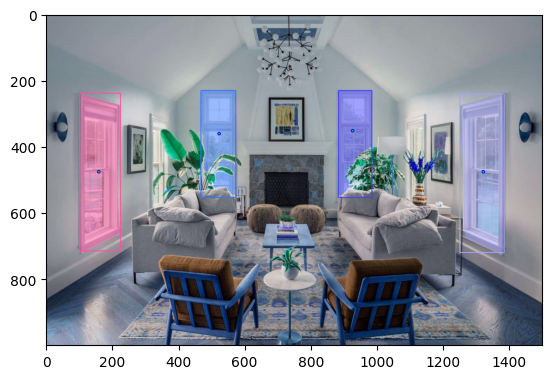

E:\3d-recon\MoGe\ASARoomImage\r23.jpg
labels ['window. 0.27']
Before NMS: 1 boxes
After NMS: 1 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.27']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


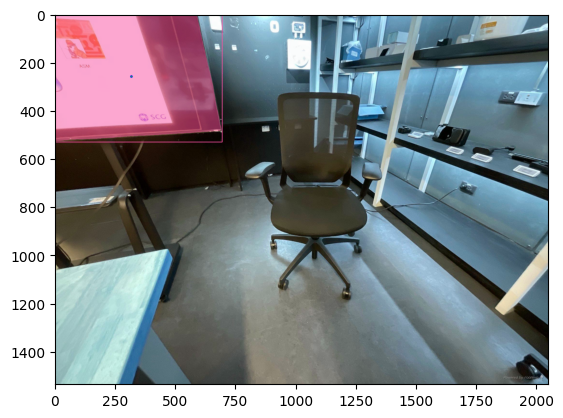

E:\3d-recon\MoGe\ASARoomImage\r24.jpg
labels ['window. 0.44']
Before NMS: 1 boxes
After NMS: 1 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.44']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


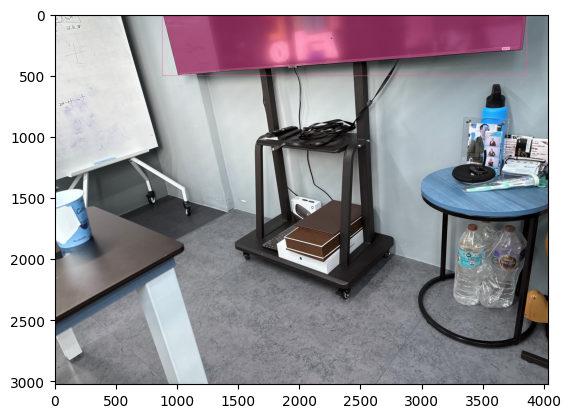

E:\3d-recon\MoGe\ASARoomImage\rr01.jpg
labels ['window. 0.47', 'door. 0.45', 'door. 0.44', 'door. 0.26', 'mirror. 0.35', 'window. 0.28']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.47', 'door. 0.45', 'door. 0.44', 'mirror. 0.35']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


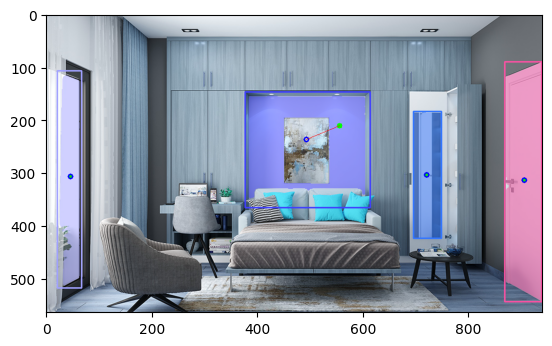

E:\3d-recon\MoGe\ASARoomImage\rr02.jpg
labels ['window. 0.39', 'window. 0.29', 'window. 0.41']
Before NMS: 3 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.41']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


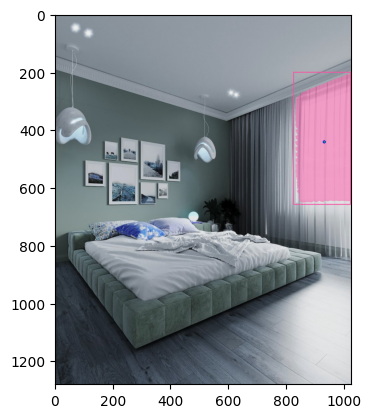

E:\3d-recon\MoGe\ASARoomImage\rr03.jpg
labels ['mirror. 0.47', 'door. 0.34', 'mirror. 0.31', 'door. 0.27', 'door. 0.37']
Before NMS: 5 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 7
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.47', 'door. 0.37', 'door. 0.34', 'mirror. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


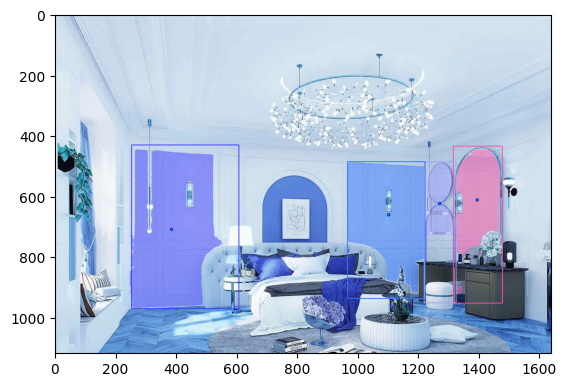

E:\3d-recon\MoGe\ASARoomImage\rr04.png
labels ['window. 0.58', 'window. 0.39', 'window. 0.35', 'window. 0.31', 'window. 0.32', 'window. 0.29', 'window. 0.28']
Before NMS: 7 boxes
After NMS: 7 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.58']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


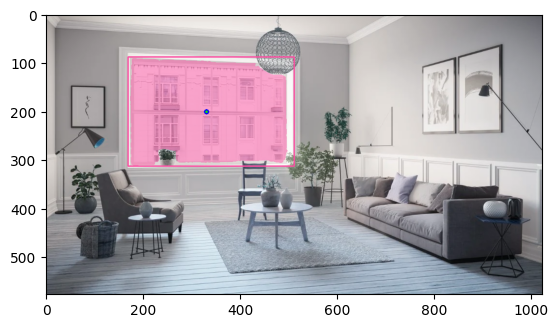

E:\3d-recon\MoGe\ASARoomImage\rr05.png
labels ['door. 0.76', 'mirror. 0.64', 'window. 0.31', 'window. 0.26', 'window. 0.30', 'window. 0.28', 'window. 0.28', 'window. 0.28']
Before NMS: 8 boxes
After NMS: 8 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 6
valid_components 2
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.76', 'mirror. 0.64', 'window. 0.31', 'window. 0.30']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


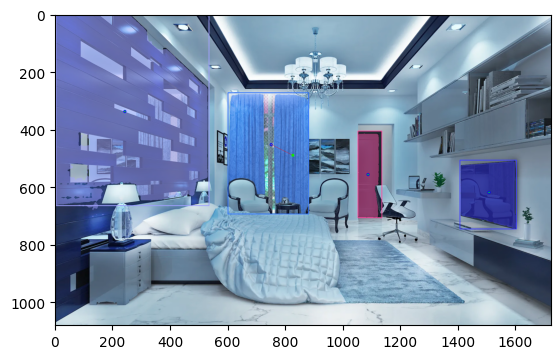

E:\3d-recon\MoGe\ASARoomImage\rr06.png
labels ['window. 0.46', 'door. 0.49', 'mirror. 0.38', 'window. 0.30', 'window. 0.25', 'window. 0.26']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.49', 'window. 0.46', 'mirror. 0.38']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


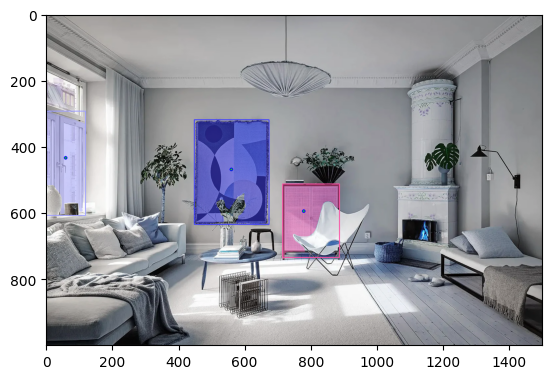

E:\3d-recon\MoGe\ASARoomImage\rr07.png
labels ['mirror. 0.74', 'door. 0.37', 'door. 0.32', 'door. 0.31']
Before NMS: 4 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 4
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.74', 'door. 0.37', 'door. 0.32']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


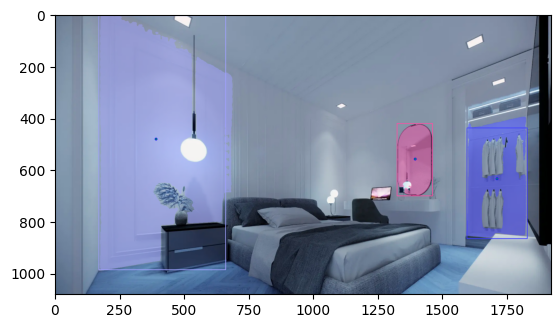

E:\3d-recon\MoGe\ASARoomImage\Toilet (2).jpeg
labels ['mirror. 0.72', 'door. 0.43', 'window. 0.32']
Before NMS: 3 boxes
After NMS: 2 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.72', 'door. 0.43']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


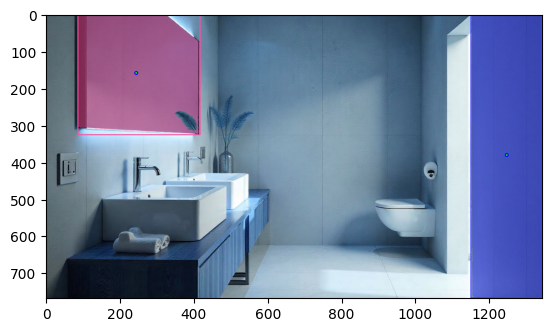

E:\3d-recon\MoGe\ASARoomImage\Toilet (3).jpeg
labels ['mirror. 0.58', 'mirror. 0.57', 'door. 0.72', 'mirror. 0.25', 'window. 0.32']
Before NMS: 5 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 4
valid_components 1
valid_components 1
valid_components 2
FILTERED SAM Segmentations from GroundingDINO BBOX
['door. 0.72', 'mirror. 0.58', 'mirror. 0.57']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


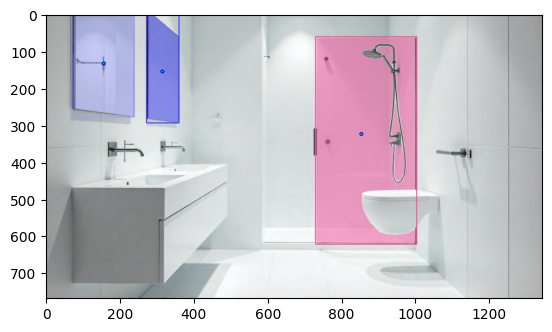

E:\3d-recon\MoGe\ASARoomImage\Toilet (4).jpeg
labels ['mirror. 0.54', 'door. 0.53', 'door. 0.26', 'window. 0.30', 'door. 0.25']
Before NMS: 5 boxes
After NMS: 4 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.54', 'door. 0.53', 'door. 0.26']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


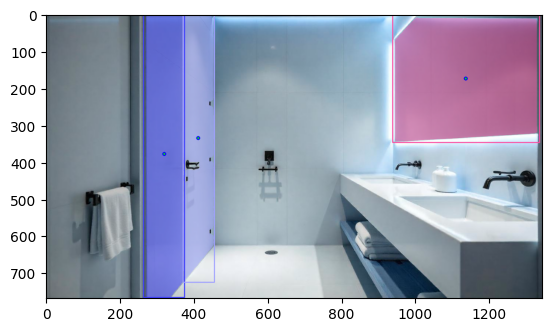

E:\3d-recon\MoGe\ASARoomImage\Toilet (5).jpeg
labels ['mirror. 0.61', 'door. 0.40', 'door. 0.27', 'window. 0.36', 'window. 0.34']
Before NMS: 5 boxes
After NMS: 3 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 3
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.61', 'door. 0.40', 'door. 0.27']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


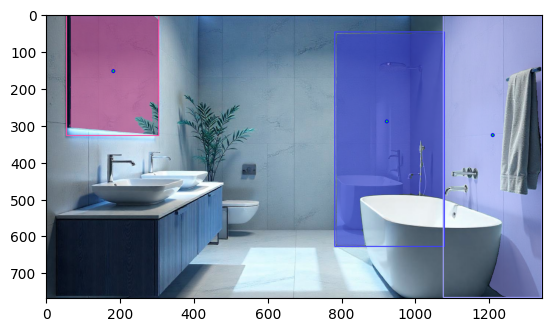

E:\3d-recon\MoGe\ASARoomImage\Toilet (6).jpeg
labels ['window. 0.76', 'mirror. 0.65', 'mirror. 0.58', 'mirror. 0.39', 'door. 0.55', 'mirror. 0.35']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.76', 'mirror. 0.65', 'mirror. 0.58', 'door. 0.55']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


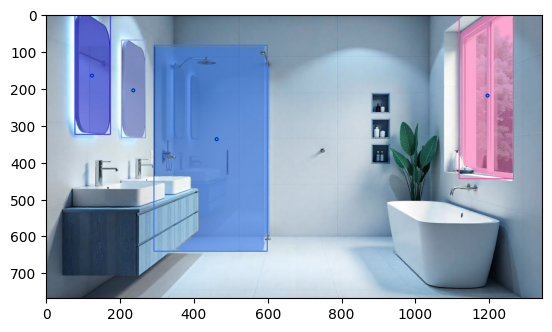

E:\3d-recon\MoGe\ASARoomImage\Toilet (7).jpeg
labels ['mirror. 0.79', 'window. 0.56', 'window. 0.51', 'window. 0.46', 'door. 0.34', 'window. 0.30']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 11
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.79', 'window. 0.56', 'window. 0.51', 'window. 0.46', 'door. 0.34']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


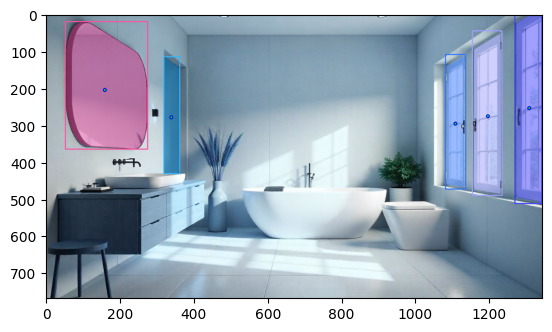

E:\3d-recon\MoGe\ASARoomImage\Toilet.jpeg
labels ['mirror. 0.65', 'window. 0.47', 'window. 0.31', 'door. 0.28', 'window. 0.31']
Before NMS: 5 boxes
After NMS: 5 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 3
FILTERED SAM Segmentations from GroundingDINO BBOX
['mirror. 0.65', 'window. 0.47', 'window. 0.31', 'window. 0.31']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


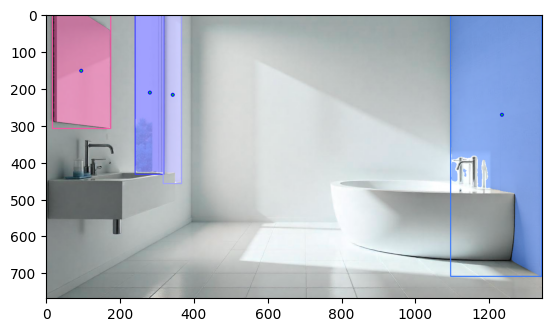

E:\3d-recon\MoGe\ASARoomImage\wedo1.png
labels ['window. 0.41', 'door. 0.30', 'door. 0.30', 'door. 0.27', 'door. 0.26', 'door. 0.28']
Before NMS: 6 boxes
After NMS: 6 boxes
ALL SAM Segmentations from GroundingDINO BBOX
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 1
valid_components 3
FILTERED SAM Segmentations from GroundingDINO BBOX
['window. 0.41', 'door. 0.30', 'door. 0.30', 'door. 0.28']
FILTERED SAM Segmentations from GroundingDINO BBOX
WITH BBOX CENTER POINTS


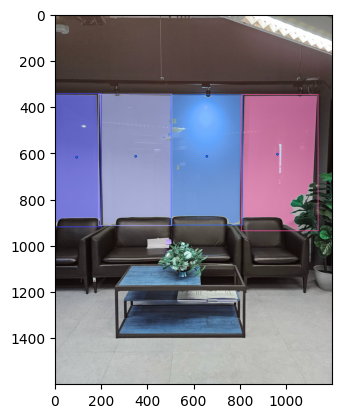

In [4]:
BOX_THRESHOLD = 0.25
TEXT_THRESHOLD = 0.25
NMS_THRESHOLD = 0.8

CLASSES = ["mirror.", "window.", "door."]

SOURCE_PATH = rf"E:\3d-recon\MoGe\ASARoomImage"
images = os.listdir(SOURCE_PATH)

for img in images:

    SOURCE_IMAGE_PATH = rf"E:\3d-recon\MoGe\ASARoomImage\{img}"

    print(SOURCE_IMAGE_PATH)

    if os.path.exists(SOURCE_IMAGE_PATH):
        
        ######################### DO GROUNDING DETECTION ##########################
        # load image
        image = cv2.imread(SOURCE_IMAGE_PATH)

        # detect objects
        detections = grounding_dino_model.predict_with_classes(
            image=image,
            classes=CLASSES,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # # annotate image with detections
        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        labels = [
            f"{CLASSES[class_id]} {confidence:0.2f}" 
            for _, _, confidence, class_id, _, _ 
            in detections]
        
        print("labels", labels)
        print(f"Before NMS: {len(detections.xyxy)} boxes")
        annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections)#, labels=labels)
        # plt.imshow(annotated_frame)
        # plt.show()

        # print("torch.from_numpy(detections.xyxy)", torch.from_numpy(detections.xyxy).dtype)
        # print("torch.from_numpy(detections.confidence)", torch.from_numpy(detections.confidence).dtype)
        
        ############################################################################
        ######################### DO NMS POSTPROCESSING ##########################
        # NMS post process
        nms_idx = torchvision.ops.nms(
            torch.from_numpy(detections.xyxy), 
            torch.from_numpy(detections.confidence), 
            NMS_THRESHOLD
        ).numpy().tolist()


        detections.xyxy = detections.xyxy[nms_idx]
        detections.confidence = detections.confidence[nms_idx]
        detections.class_id = detections.class_id[nms_idx]

        print(f"After NMS: {len(detections.xyxy)} boxes")

        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections)
        # plt.imshow(annotated_frame)
        # plt.show()
        
        #############################################################################
        ######################### DO SAM SEGMENTATION ###############################

        # Prompting SAM with detected boxes
        def segment(sam_predictor: SamPredictor, image: np.ndarray, xyxy: np.ndarray) -> np.ndarray:
            sam_predictor.set_image(image)
            result_masks = []
            for box in xyxy:
                masks, scores, logits = sam_predictor.predict(
                    box=box,
                    multimask_output=True
                )
                index = np.argmax(scores)
                result_masks.append(masks[index])
            return np.array(result_masks)


        # convert detections to masks
        detections.mask = segment(
            sam_predictor=sam_predictor,
            image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
            xyxy=detections.xyxy
        )

        print("ALL SAM Segmentations from GroundingDINO BBOX")
        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        mask_annotator = sv.MaskAnnotator(color_lookup = ColorLookup.INDEX)
        annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
        annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)#, labels=labels)
        # plt.imshow(annotated_image)
        # plt.show()

        ################################################################################################
        # FILTER MASKS #
        ################################################################################################
        # First remove small masks (< 10% image area)
        filtered_masks, filtered_boxes = filter_small_masks(
                                                            masks=detections.mask,
                                                            boxes=detections.xyxy,
                                                            image_shape=image.shape[:2],  # (H, W)
                                                            min_area_ratio=0.01
                                                        )

        filtered_masks, filtered_boxes = filter_noisy_masks(filtered_masks,
                                                            filtered_boxes,
                                                            max_components=20,
                                                            min_component_area=10)


        final_masks, final_boxes = remove_masks_that_contain_others(
                                                                    masks=filtered_masks,
                                                                    boxes=filtered_boxes,
                                                                    threshold=0.9
                                                                    )
        ################################################################################################
        ################################################################################################

        detections.mask = final_masks
        detections.xyxy = final_boxes

        print("FILTERED SAM Segmentations from GroundingDINO BBOX")
        # annotate image with detections
        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        mask_annotator = sv.MaskAnnotator(color_lookup = ColorLookup.INDEX)
        labels = [
            f"{CLASSES[class_id]} {confidence:0.2f}" 
            for _, _, confidence, class_id, _, _ 
            in detections]
        annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
        annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)#, labels=labels)
        print(labels)
        # plt.imshow(annotated_image)
        # plt.show()


        ################################################################################################
        ################################################################################################
        for i, mask in enumerate(final_masks):  # mask: (H, W) binary
            mask_uint8 = mask.astype(np.uint8)

            # Compute center from moments
            moments = cv2.moments(mask_uint8)
            if moments["m00"] != 0:
                original_cx = int(moments["m10"] / moments["m00"])
                original_cy = int(moments["m01"] / moments["m00"])
            else:
                ys, xs = np.where(mask)
                original_cx = int(np.mean(xs))
                original_cy = int(np.mean(ys))

            cx, cy = original_cx, original_cy

            if not mask[cy, cx]:
                ys, xs = np.where(mask)
                distances = np.sqrt((xs - cx)**2 + (ys - cy)**2)

                # Get index of 25th percentile closest point
                percentile_index = int(len(distances) * 0.2)
                sorted_indices = np.argsort(distances)

                idx = sorted_indices[percentile_index]
                cx, cy = int(xs[idx]), int(ys[idx])

            # Draw adjusted center (green)
            cv2.circle(annotated_image, (cx, cy), radius=5, color=(0, 255, 0), thickness=-1)

            # Draw original center (red)
            cv2.circle(annotated_image, (original_cx, original_cy), radius=4, color=(0, 0, 255), thickness=2)

            # Draw line (blue)
            cv2.line(annotated_image, (original_cx, original_cy), (cx, cy), color=(255, 0, 0), thickness=1)
        ################################################################################################
        ################################################################################################


        # save the annotated grounded-sam image
        cv2.imwrite(os.path.join("./output/", f"walls_annotated_{img[:-4]}.jpg"), annotated_image)
        print("FILTERED SAM Segmentations from GroundingDINO BBOX")
        print("WITH BBOX CENTER POINTS")

        import matplotlib.pyplot as plt
        plt.imshow(annotated_image)
        plt.show()

